In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/kaggle/wheat/yolov5

/content/drive/MyDrive/kaggle/wheat/yolov5


In [ ]:
%pip install -qr requirements.txt

     |████████████████████████████████| 596 kB 4.1 MB/s 
     |████████████████████████████████| 38.1 MB 1.3 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
import torch
import utils

In [ ]:
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.1-168-g5743deb torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.2/166.8 GB disk)


In [ ]:
import numpy as np
import pandas as pd 
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import re
import random
import shutil

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/kaggle/wheat/train.csv")

In [ ]:
df

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1
...,...,...,...,...,...
147788,5e0747034,1024,1024,"[64.0, 619.0, 84.0, 95.0]",arvalis_2
147789,5e0747034,1024,1024,"[292.0, 549.0, 107.0, 82.0]",arvalis_2
147790,5e0747034,1024,1024,"[134.0, 228.0, 141.0, 71.0]",arvalis_2
147791,5e0747034,1024,1024,"[430.0, 13.0, 184.0, 79.0]",arvalis_2


In [ ]:
%cd /content/drive/MyDrive/kaggle/wheat/train
%mkdir image
%mv *.jpg ./image

/content/drive/MyDrive/kaggle/wheat/train


In [ ]:
len(os.listdir('/content/drive/MyDrive/kaggle/wheat/train/image'))

FileNotFoundError: ignored

In [ ]:
len(df["image_id"].unique())

3373

In [ ]:
files = os.listdir("/content/drive/MyDrive/kaggle/wheat/train/image")
id_list = []
for f in files:
  if not f[:-4] in df["image_id"].values:
    id_list.append(f)

id_list

In [ ]:
len(id_list)

49

In [ ]:
id_list

['b45c5294d.jpg',
 'c18c32da0.jpg',
 'c74ca81bd.jpg',
 'cfc9040ca.jpg',
 'cf1d2f504.jpg',
 'ccb3892c1.jpg',
 'd83808467.jpg',
 'd7e657453.jpg',
 'd771bb084.jpg',
 'dec23c826.jpg',
 'de2a3cf37.jpg',
 'dd5d2fa9e.jpg',
 'e01ad95cf.jpg',
 'e4ec17f9b.jpg',
 'ec196d18a.jpg',
 'ed00a614d.jpg',
 'f2a6804d2.jpg',
 'f9cafa47f.jpg',
 'f530a5d4b.jpg',
 'ffbb9c623.jpg',
 '7e1caf1f7.jpg',
 '8425a537b.jpg',
 '83a94fc79.jpg',
 '8a5cb62db.jpg',
 '8de789df8.jpg',
 '952e7d15c.jpg',
 '91d4e3750.jpg',
 '9e21e7969.jpg',
 'a3ce975cd.jpg',
 'ab20ec355.jpg',
 '1a9792bfc.jpg',
 '2e6c333a7.jpg',
 '2d80f9c49.jpg',
 '3116768f0.jpg',
 '39a0e5556.jpg',
 '45fddc611.jpg',
 '46c6a747a.jpg',
 '49e40c7a4.jpg',
 '526d737d1.jpg',
 '5901a73fe.jpg',
 '581eaf87b.jpg',
 '5cbd092f9.jpg',
 '65d0b13aa.jpg',
 '6584c18c0.jpg',
 '69352f3fa.jpg',
 '00b5c6764.jpg',
 '0cf7ef43d.jpg',
 '0e7832f0b.jpg',
 '155c440e8.jpg']

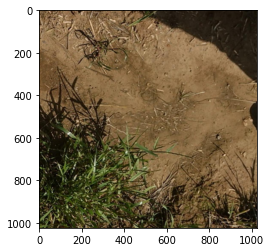

In [ ]:
img = mpimg.imread('/content/drive/MyDrive/kaggle/wheat/train/image/b45c5294d.jpg')
plt.imshow(img)

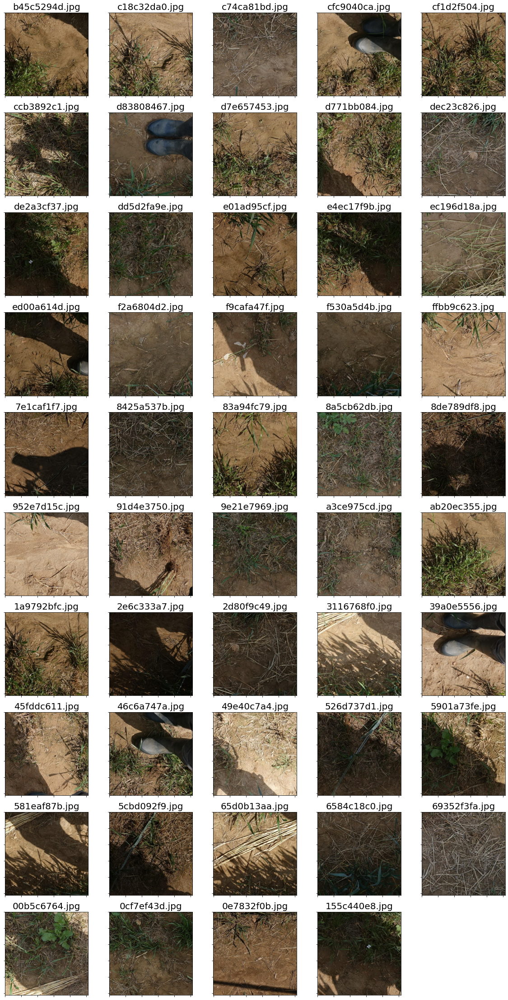

In [ ]:
fig = plt.figure(figsize=(20,40))
X = 10
Y = 5

for i, _f in enumerate(id_list):
  img = mpimg.imread(f"/content/drive/MyDrive/kaggle/wheat/train/image/{_f}")
  ax = f"ax{i}"
  ax = fig.add_subplot(X, Y, i + 1)
  ax.set_title(_f,fontsize=20)
  ax.tick_params(labelbottom=False,
               labelleft=False)
  plt.imshow(img)



In [ ]:
import shutil
for _f in id_list:
  new_path = shutil.move(f"/content/drive/MyDrive/kaggle/wheat/train/image/{_f}", "/content/drive/MyDrive/kaggle/wheat/train/image_rem/")

In [ ]:
len(os.listdir('/content/drive/MyDrive/kaggle/wheat/train/image'))

3373

In [ ]:
df[:1]

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1


In [ ]:
%rm /content/drive/MyDrive/kaggle/wheat/train/image/*.txt

In [ ]:
%rm /content/drive/MyDrive/kaggle/wheat/val/image/*.txt

In [ ]:
%mv /content/drive/MyDrive/kaggle/wheat/train/image/*.txt /content/drive/MyDrive/kaggle/wheat/train/label/

In [ ]:
len(os.listdir("/content/drive/MyDrive/kaggle/wheat/train/image/"))

3373

In [ ]:
for id in df["image_id"].unique():
  path = f"/content/drive/MyDrive/kaggle/wheat/train/label/{id}.txt"
  txt = ""
  img_width = 1024
  img_height = 1024

  bbox_txt = df.loc[df["image_id"] == id, "bbox"].to_string(index=False)
  bbox_txt = re.sub("[ \[\]]", "", bbox_txt)
  bbox_txt = bbox_txt.replace("[","1 ").replace(","," ")

  for line in bbox_txt.split("\n"):
    param_list = line.split(" ")
    x_min = float(param_list[0])
    y_min = float(param_list[1])
    width = float(param_list[2])
    height = float(param_list[3].replace("...",""))

    x_mid = x_min + width/2
    y_mid = y_min + height/2

    x_mid_nor = x_mid/img_width
    y_mid_nor = y_mid/img_height
    width_nor = width/img_width
    height_nor = height/img_height

    line_mod = f"0 {x_mid_nor} {y_mid_nor} {width_nor} {height_nor}"
    txt += line_mod + "\n"

  f = open(path, 'w')
  f.write(txt) 
  f.close()

In [ ]:
len(os.listdir("/content/drive/MyDrive/kaggle/wheat/train/label"))

3373

In [ ]:
random.seed(0)
val_list = random.sample(list(df["image_id"].unique()), len(df["image_id"].unique())//5)
len(val_list)

674

In [ ]:
for id in val_list:
  new_imgpath = shutil.move(f"/content/drive/MyDrive/kaggle/wheat/train/image/{id}.jpg", "/content/drive/MyDrive/kaggle/wheat/val/image")
  new_labelpath = shutil.move(f"/content/drive/MyDrive/kaggle/wheat/train/label/{id}.txt", "/content/drive/MyDrive/kaggle/wheat/val/label")

In [ ]:
%cd /content/drive/MyDrive/kaggle/wheat/yolov5

/content/drive/MyDrive/kaggle/wheat/yolov5


In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/kaggle/wheat/learnig_log

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
!python train.py --img 1024 --data wheat.yaml --cfg yolov5m.yaml --weights '' --project '/content/drive/MyDrive/kaggle/wheat/learnig_log' --batch-size 16 --epochs 150

train: weights=, cfg=yolov5m.yaml, data=wheat.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=1024, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=/content/drive/MyDrive/kaggle/wheat/learnig_log, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 8 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-168-g5743deb torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw

In [ ]:
!python detect.py --source /content/drive/MyDrive/kaggle/wheat/test/ --conf 0.5 --weights /content/drive/MyDrive/kaggle/wheat/learnig_log/exp/weights/best.pt --save-conf --save-txt

detect: weights=['/content/drive/MyDrive/kaggle/wheat/learnig_log/exp/weights/best.pt'], source=/content/drive/MyDrive/kaggle/wheat/test/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-168-g5743deb torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5m summary: 290 layers, 20852934 parameters, 0 gradients
image 1/10 /content/drive/MyDrive/kaggle/wheat/test/2fd875eaa.jpg: 640x640 25 wheats, Done. (0.029s)
image 2/10 /content/drive/MyDrive/kaggle/wheat/test/348a992bb.jpg: 640x640 35 wheats, Done. (0.029s)
image 3/10 /content/drive/MyDrive/kaggle/wheat/test/51b3e36ab.jpg: 640x640 23 wheats, Done. (0.029s)
image 4/10 /content/drive

In [ ]:
detect_list = os.listdir("/content/drive/MyDrive/kaggle/wheat/test")
detect_list

['348a992bb.jpg',
 '51b3e36ab.jpg',
 '2fd875eaa.jpg',
 '53f253011.jpg',
 'cc3532ff6.jpg',
 'f5a1f0358.jpg',
 '51f1be19e.jpg',
 '796707dd7.jpg',
 'aac893a91.jpg',
 'cb8d261a3.jpg']

In [ ]:
img_width = 1024
img_height = 1024

detect_value = []
mod_list = []

for id in detect_list:
  id = id[:-4]
  mod_list.append(id)
  path = f"/content/drive/MyDrive/kaggle/wheat/yolov5/runs/detect/exp/labels/{id}.txt"
  txt = ""

  with open(path) as f:
    for line in f:
      line_list = line.split(" ")

      x_mid_nor = float(line_list[1])
      y_mid_nor = float(line_list[2])
      width_nor = float(line_list[3])
      height_nor = float(line_list[4])
      conf = float(line_list[5])

      width = width_nor * img_width  
      height = height_nor * img_height   
      x_min = x_mid_nor * img_width - width/2   
      y_min = y_mid_nor * img_height - height/2    

      conf =round(conf,2)
      x_min = round(x_min,1)
      y_min = round(y_min,1)
      width = round(width,1)
      height = round(height,1)

      line_mod = f"{conf} {x_min} {y_min} {width} {height} "     
      txt += line_mod
    detect_value.append(txt)
    
detect_df = pd.DataFrame({"image_id": mod_list,
                         "PredictionString": detect_value})

detect_df.to_csv("/content/drive/MyDrive/kaggle/wheat/test/csv/submission.csv", index=False)
detect_df





,image_id,PredictionString
0,348a992bb,0.51 369.0 860.0 86.0 77.0 0.53 387.0 880.0 86...
1,51b3e36ab,0.58 1.0 286.0 71.0 179.0 0.71 394.0 427.0 85....
2,2fd875eaa,0.54 995.0 486.0 29.0 79.0 0.68 987.0 584.0 36...
3,53f253011,0.57 993.0 504.0 31.0 86.0 0.66 204.0 559.0 10...
4,cc3532ff6,0.5 -0.0 763.0 40.0 79.0 0.52 761.0 -0.0 87.0 ...
5,f5a1f0358,0.51 131.0 618.0 66.0 67.0 0.55 1.0 3.0 66.0 7...
6,51f1be19e,0.54 567.0 582.0 179.0 130.0 0.56 73.0 698.0 1...
7,796707dd7,0.5 94.0 788.0 110.0 96.0 0.51 195.0 476.0 108...
8,aac893a91,0.51 473.0 981.0 94.0 42.0 0.59 317.0 863.0 82...
9,cb8d261a3,0.56 649.0 864.0 85.0 129.0 0.57 474.0 924.0 1...


In [ ]:
!cd /content/drive/MyDrive/kaggle/wheat/yolov5

In [ ]:
!python detect.py --source /content/drive/MyDrive/kaggle/wheat/test/ --conf 0.5 \
--weights /content/drive/MyDrive/kaggle/wheat/learnig_log/exp/weights/best.pt --save-conf --save-txt

detect: weights=['/content/drive/MyDrive/kaggle/wheat/learnig_log/exp/weights/best.pt'], source=/content/drive/MyDrive/kaggle/wheat/test/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-168-g5743deb torch 1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
YOLOv5m summary: 290 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/10 /content/drive/MyDrive/kaggle/wheat/test/2fd875eaa.jpg: 640x640 25 wheats, Done. (0.015s)
image 2/10 /content/drive/MyDrive/kaggle/wheat/test/348a992bb.jpg: 640x640 35 wheats, Done. (0.015s)
image 3/10 /content/drive/MyDrive/kaggle/wheat/test/51b3e36ab.jpg: 640x640 23 wheats, Done. (0.015s)


In [ ]:
for id in df["image_id"].unique():
  path = f"/content/drive/MyDrive/kaggle/wheat/train/label/{id}.txt"
  txt = ""
  img_width = 1024
  img_height = 1024

  bbox_txt = df.loc[df["image_id"] == id, "bbox"].to_string(index=False)
  bbox_txt = re.sub("[ \[\]]", "", bbox_txt)
  bbox_txt = bbox_txt.replace("[","1 ").replace(","," ")

  for line in bbox_txt.split("\n"):
    param_list = line.split(" ")
    x_min = float(param_list[0])
    y_min = float(param_list[1])
    width = float(param_list[2])
    height = float(param_list[3].replace("...",""))

    x_mid = x_min + width/2
    y_mid = y_min + height/2

    x_mid_nor = x_mid/img_width
    y_mid_nor = y_mid/img_height
    width_nor = width/img_width
    height_nor = height/img_height

    line_mod = f"0 {x_mid_nor} {y_mid_nor} {width_nor} {height_nor}"
    txt += line_mod + "\n"

  f = open(path, 'w')
  f.write(txt) 
  f.close()